In [1]:
import scanpy as sc

# Function to run inferCNV and save the results whitin the data object

In [64]:
import numpy as np
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings

warnings.simplefilter("ignore")

sc.settings.set_figure_params(figsize=(5, 5))


def inferCNV_for_simulated_data(path, data_name, window_size, step):
    """
    Parameters:
    
    """

    adata = sc.read_h5ad(data_path + '/' + data_name + '.h5ad')
    
    layer = 'CNV_simulated'
    adata.X = adata.layers[layer].copy()

    cnv.tl.infercnv(
        adata,
        reference_key="cell_type",
        reference_cat=['ciliated cell', 'basal cell'], #'fibroblast', 'macrophage', 'lymphocyte', 'microcirculation associated smooth muscle cell', 'blood vessel smooth muscle cell', 'unknown'
        window_size=window_size,
        step=step,
        calculate_gene_values=True,
        chunksize = 1000
    )


    
    cnv.tl.pca(adata)
    cnv.pp.neighbors(adata)
    cnv.tl.leiden(adata)
    
    # cnv clustering until four clusters
    cnv.tl.pca(adata)
    resol=0.7
    cnv.pp.neighbors(adata)
    cnv.tl.leiden(adata, resolution=resol, key_added='cnv_leiden')
    while len(np.unique(adata.obs['cnv_leiden']))!=4:
        print('Adjusting the resolution of the clustering..')
        if len(np.unique(adata.obs['cnv_leiden']))<4:
            resol=resol+0.01
            print(f'increasing resolution to {resol}')
        if len(np.unique(adata.obs['cnv_leiden']))>4:
            resol=resol-0.01
            print(f'reducing resolution to {resol}')
        cnv.tl.leiden(adata, resolution=resol, key_added='cnv_leiden')
    
    cnv.tl.leiden(adata, resolution=resol, key_added=f'cnv_leiden_res{round(resol, 2)}')


    # Save CNV heatmap
    # sc.tl.dendrogram(adata,groupby="cnv_leiden")
    cnv.pl.chromosome_heatmap(adata, 
                              groupby="cnv_leiden", 
                              dendrogram=False, 
                              vmin=-0.4, vmax=0.4,
                              save=f'_{data_name}.png')
    print('CNV heatmap saved!')
    
    # Save CNV UMAPs
    cnv.tl.umap(adata)
    cnv.tl.cnv_score(adata, groupby='cnv_leiden')
    cnv.pl.umap(adata, 
                color=['simulated_subclone', 'cnv_leiden','cnv_score'],
                save = f'_{data_name}.png')
    print('CNV UMAP saved!')

    new_path = data_path +'/'+ data_name + '_CNVinf.h5ad'
    adata.write(new_path, compression = 'gzip')
    print(f'CNV inference of {name} dataset have been performed and a new AnnData object containing the results has been saved in: {new_path}')

# Run inferCNV

## Run for subsampled read depths

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [04:08<00:00, 124.32s/it]


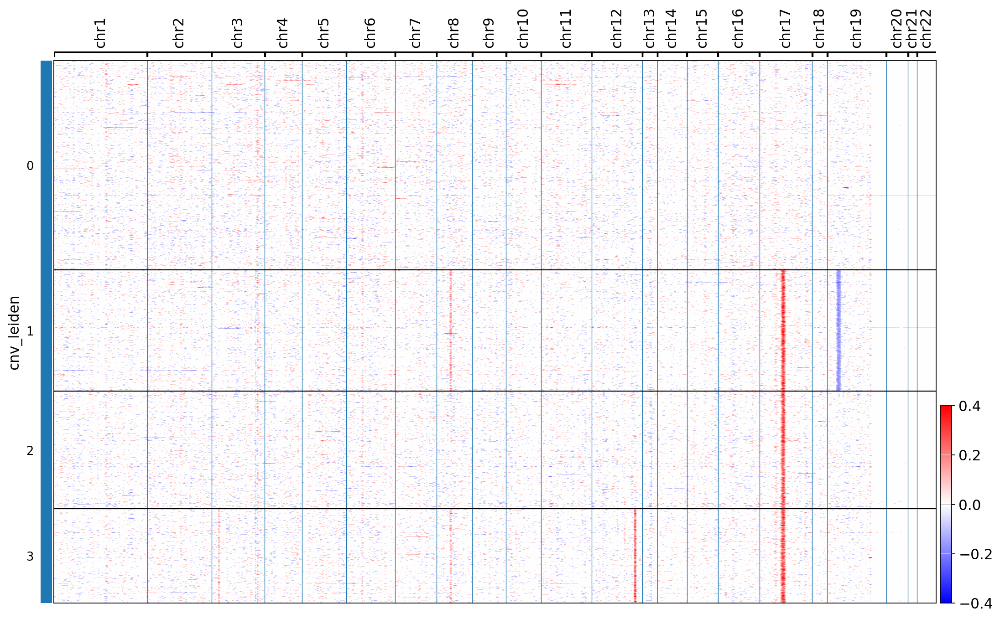

CNV heatmap saved!


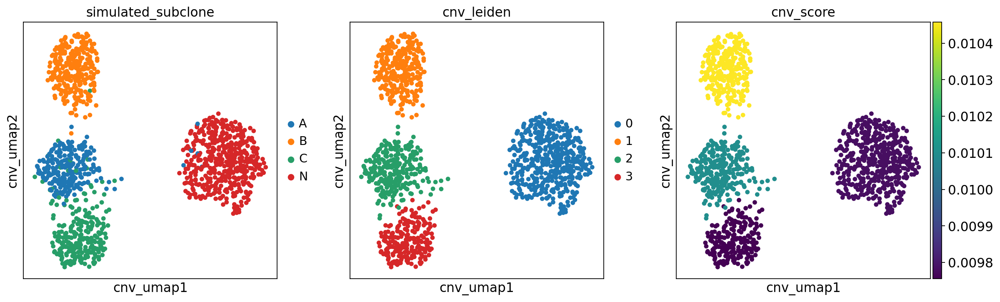

CNV UMAP saved!
CNV inference of CNV_simulated_subsampled_counts_100 dataset have been performed and a new AnnData object containing the results has been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulated_subsampled_counts_100_CNVinf.h5ad


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [04:08<00:00, 124.35s/it]


Adjusting the resolution of the clustering..
reducing resolution to 0.69
Adjusting the resolution of the clustering..
reducing resolution to 0.6799999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6699999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6599999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6499999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6399999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6299999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6199999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6099999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.5999999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.5899999999999999
Adjusting the resolution of the clustering..
reducing res

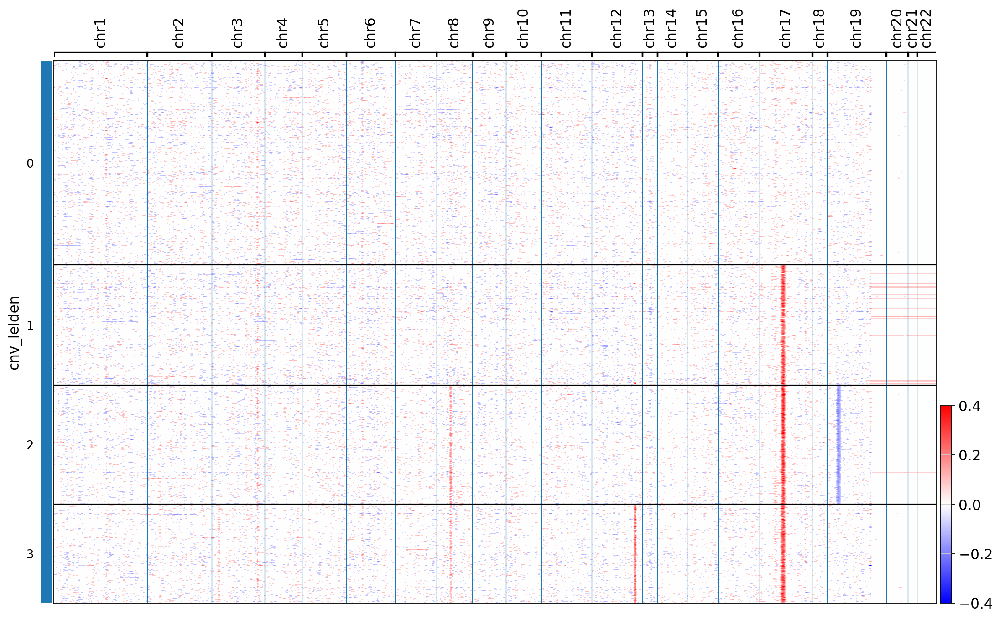

CNV heatmap saved!


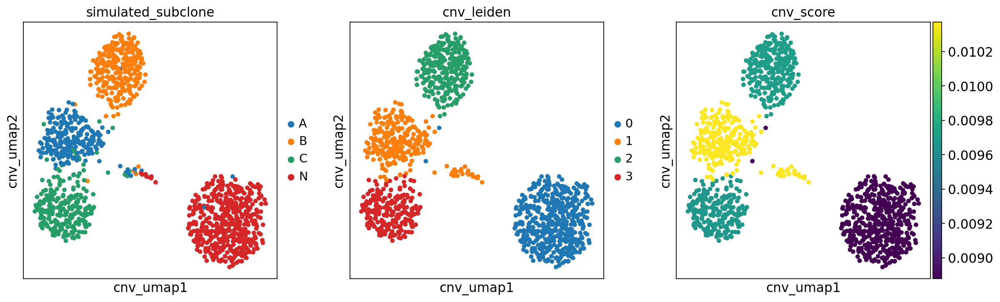

CNV UMAP saved!
CNV inference of CNV_simulated_subsampled_counts_70 dataset have been performed and a new AnnData object containing the results has been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulated_subsampled_counts_70_CNVinf.h5ad


  0%|                                                                                                                             | 0/2 [00:00<?, ?it/s]

In [ ]:
data_path = '/home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions'



data_names_counts = ['CNV_simulated_subsampled_counts_100',
                     'CNV_simulated_subsampled_counts_70', 
                     'CNV_simulated_subsampled_counts_50',
                     'CNV_simulated_subsampled_counts_20', 
                     'CNV_simulated_subsampled_counts_10',
                     'CNV_simulated_subsampled_counts_5', 
                     'CNV_simulated_subsampled_counts_1']

for name in data_names_counts:
    inferCNV_for_simulated_data(data_path, name, window_size=100, step=10)

## Run for subsampled gene panel sizes

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [04:11<00:00, 125.89s/it]


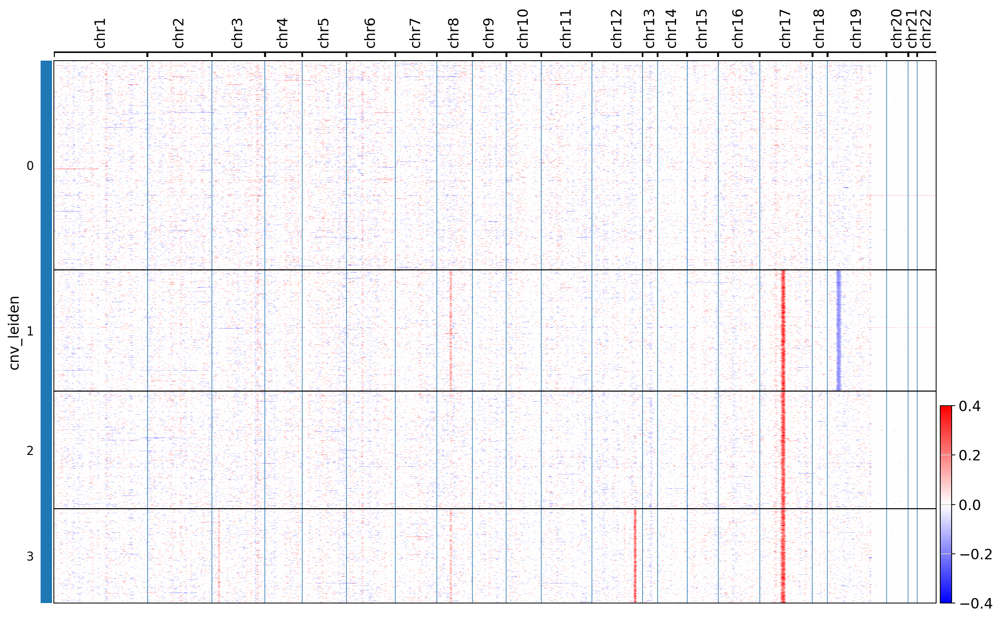

CNV heatmap saved!


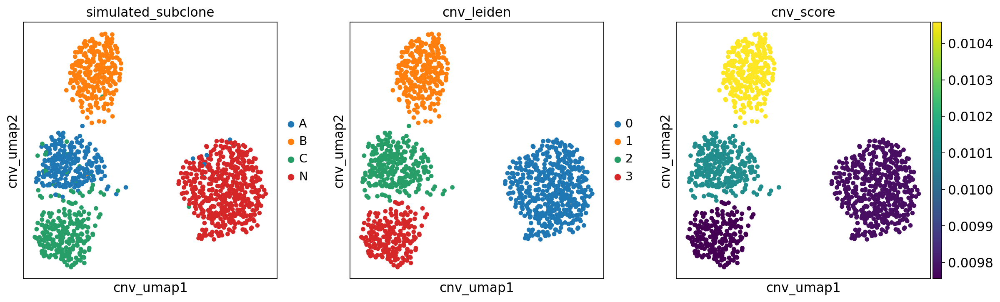

CNV UMAP saved!
CNV inference of CNV_simulated_subsampled_genes_all dataset have been performed and a new AnnData object containing the results has been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulated_subsampled_genes_all_CNVinf.h5ad


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [03:13<00:00, 96.64s/it]


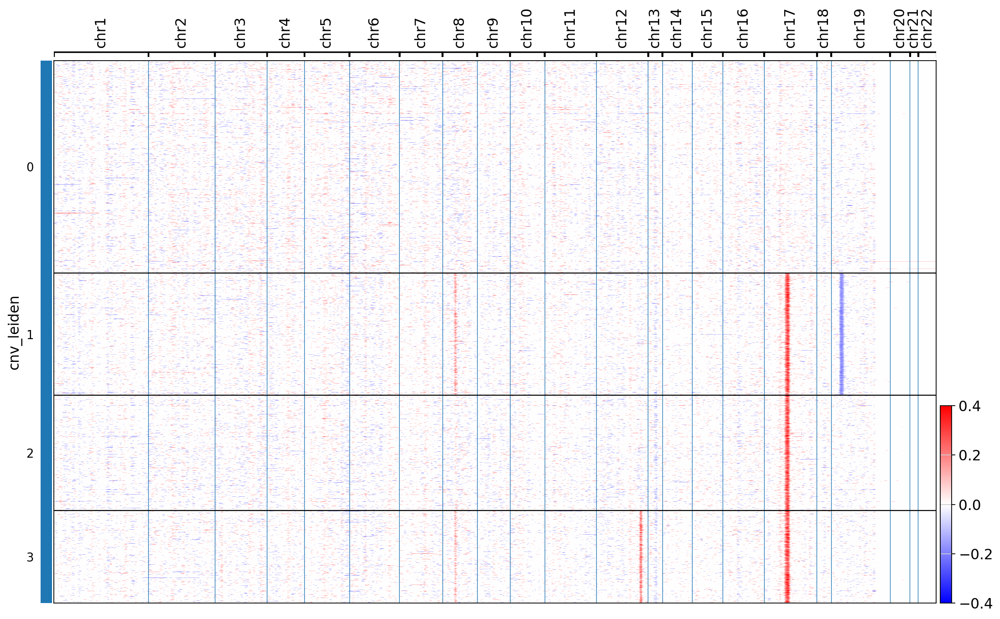

CNV heatmap saved!


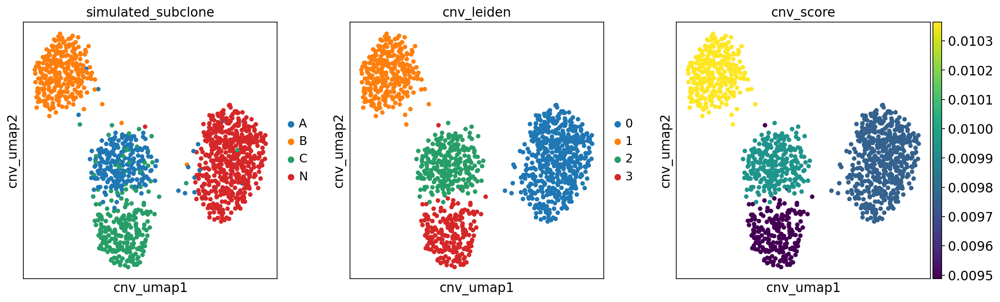

CNV UMAP saved!
CNV inference of CNV_simulated_subsampled_genes_20000 dataset have been performed and a new AnnData object containing the results has been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulated_subsampled_genes_20000_CNVinf.h5ad


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [02:22<00:00, 71.38s/it]


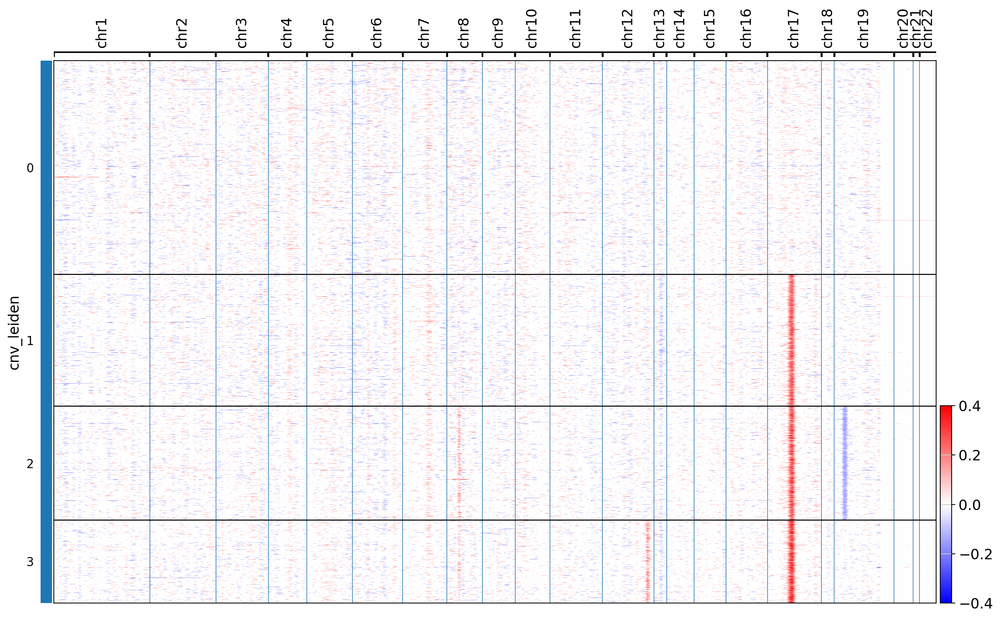

CNV heatmap saved!


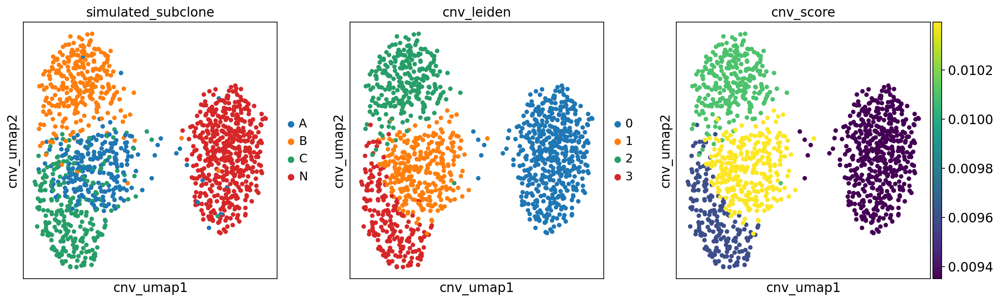

CNV UMAP saved!
CNV inference of CNV_simulated_subsampled_genes_15000 dataset have been performed and a new AnnData object containing the results has been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulated_subsampled_genes_15000_CNVinf.h5ad


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [01:50<00:00, 55.07s/it]


Adjusting the resolution of the clustering..
increasing resolution to 0.71
Adjusting the resolution of the clustering..
increasing resolution to 0.72
Adjusting the resolution of the clustering..
increasing resolution to 0.73
Adjusting the resolution of the clustering..
increasing resolution to 0.74
Adjusting the resolution of the clustering..
increasing resolution to 0.75
Adjusting the resolution of the clustering..
increasing resolution to 0.76


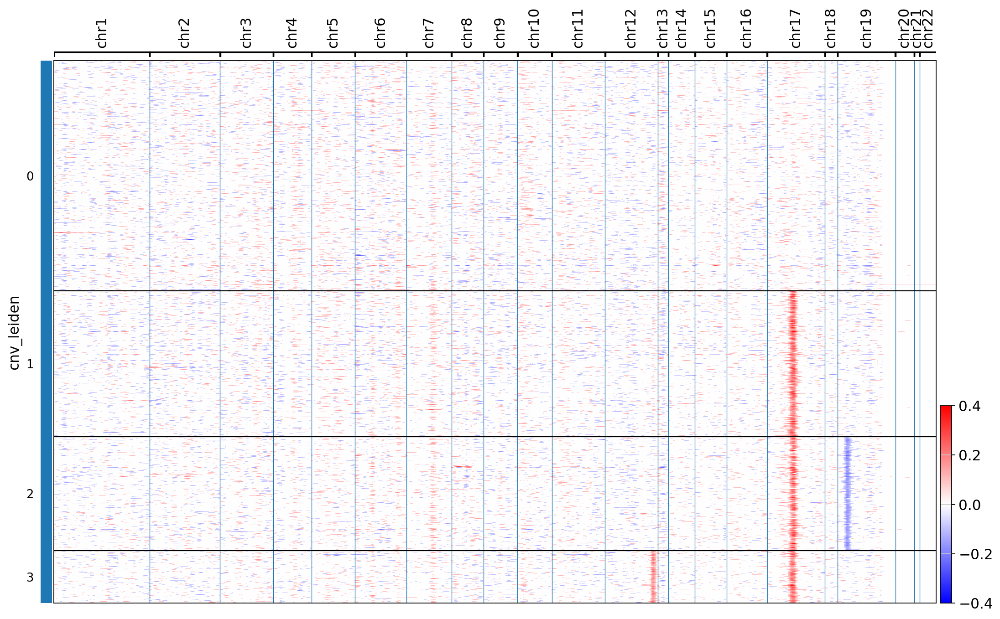

CNV heatmap saved!


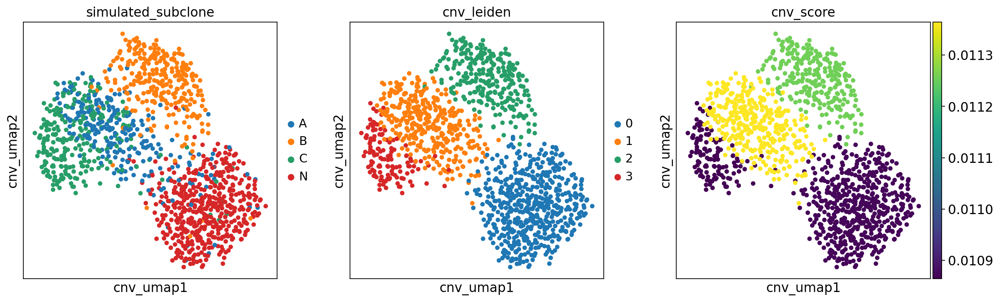

CNV UMAP saved!
CNV inference of CNV_simulated_subsampled_genes_10000 dataset have been performed and a new AnnData object containing the results has been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulated_subsampled_genes_10000_CNVinf.h5ad


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [01:10<00:00, 35.04s/it]


Adjusting the resolution of the clustering..
increasing resolution to 0.71
Adjusting the resolution of the clustering..
increasing resolution to 0.72
Adjusting the resolution of the clustering..
increasing resolution to 0.73
Adjusting the resolution of the clustering..
increasing resolution to 0.74


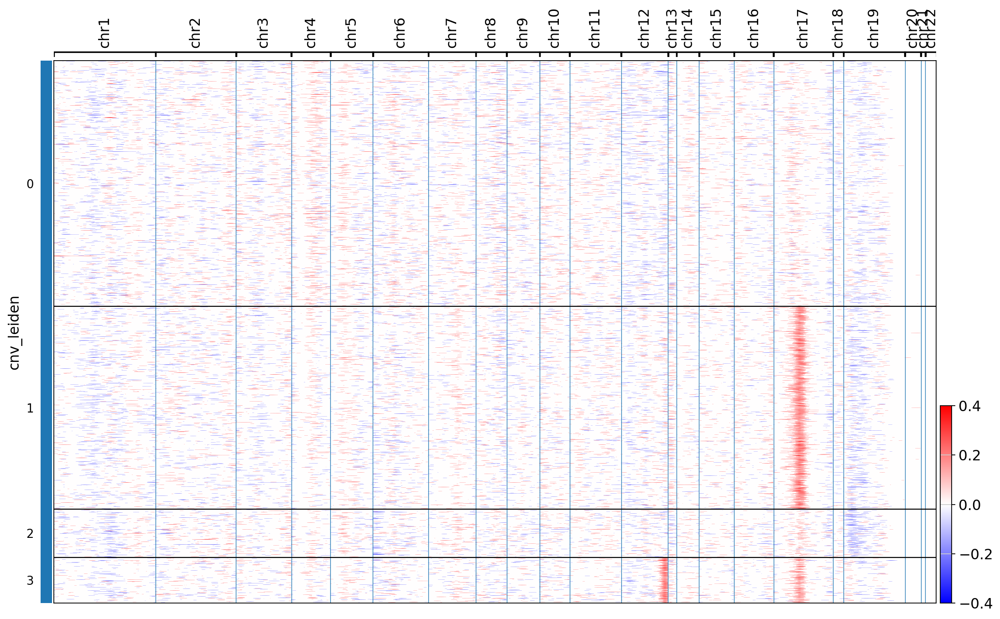

CNV heatmap saved!


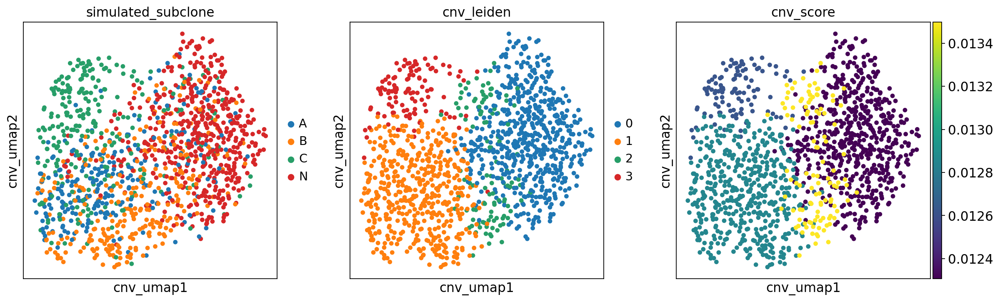

CNV UMAP saved!
CNV inference of CNV_simulated_subsampled_genes_5000 dataset have been performed and a new AnnData object containing the results has been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulated_subsampled_genes_5000_CNVinf.h5ad


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.20s/it]


Adjusting the resolution of the clustering..
reducing resolution to 0.69
Adjusting the resolution of the clustering..
reducing resolution to 0.6799999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6699999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6599999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6499999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6399999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6299999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6199999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6099999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.5999999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.5899999999999999
Adjusting the resolution of the clustering..
reducing res

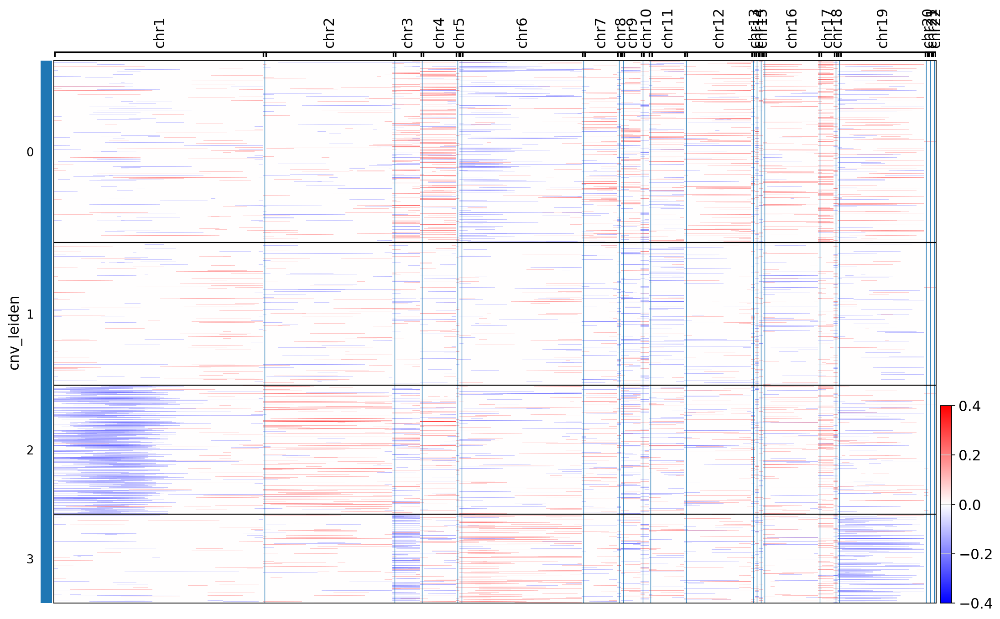

CNV heatmap saved!


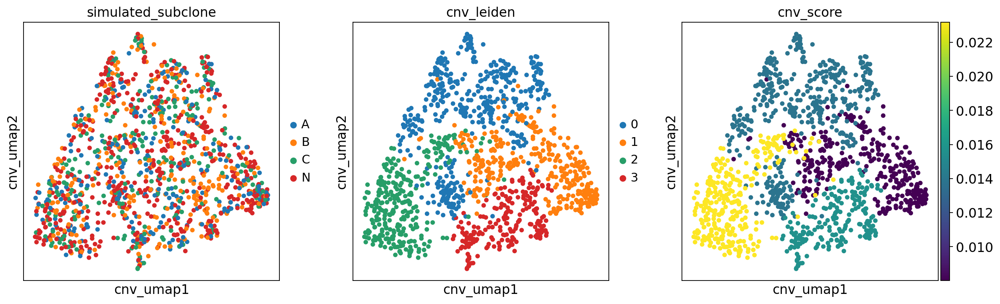

CNV UMAP saved!
CNV inference of CNV_simulated_subsampled_genes_1000 dataset have been performed and a new AnnData object containing the results has been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulated_subsampled_genes_1000_CNVinf.h5ad


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:04<00:00,  2.02s/it]


Adjusting the resolution of the clustering..
reducing resolution to 0.69
Adjusting the resolution of the clustering..
reducing resolution to 0.6799999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6699999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6599999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6499999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6399999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6299999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6199999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.6099999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.5999999999999999
Adjusting the resolution of the clustering..
reducing resolution to 0.5899999999999999
Adjusting the resolution of the clustering..
reducing res

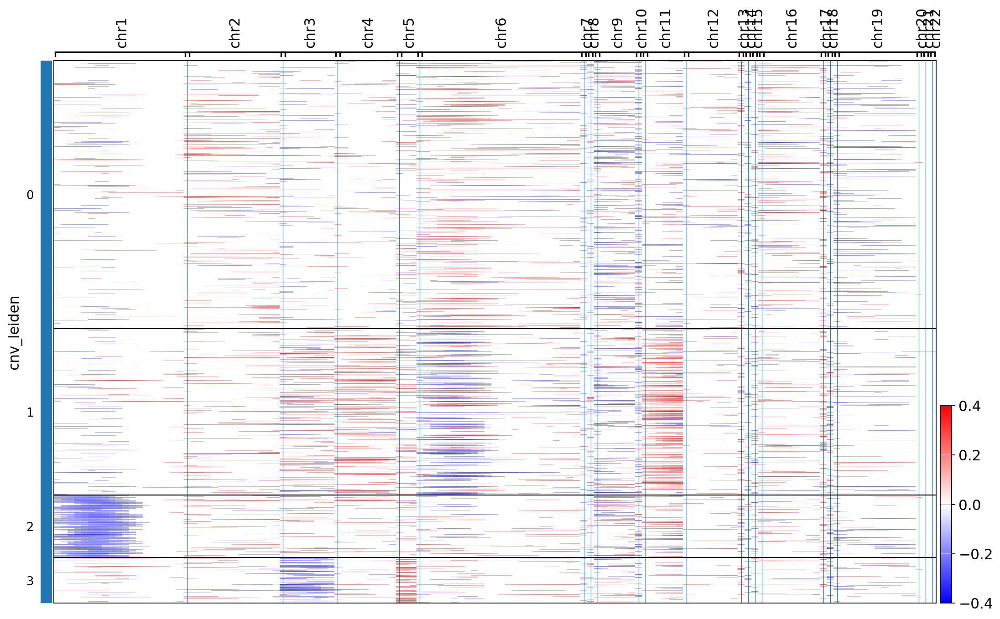

CNV heatmap saved!


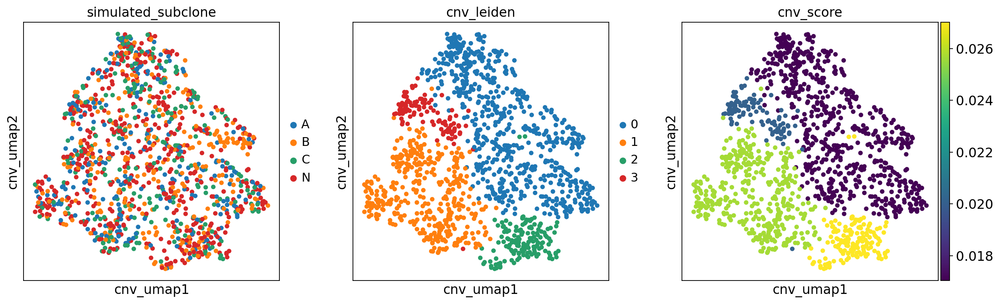

CNV UMAP saved!
CNV inference of CNV_simulated_subsampled_genes_500 dataset have been performed and a new AnnData object containing the results has been saved in: /home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions/CNV_simulated_subsampled_genes_500_CNVinf.h5ad


In [63]:
data_path = '/home/augusta/SSS_mount/insituCNV/data/simulated_CNV_data/technical_limiting_conditions'


data_names_genes = ['CNV_simulated_subsampled_genes_all',
                    'CNV_simulated_subsampled_genes_20000', 
                     'CNV_simulated_subsampled_genes_15000',
                     'CNV_simulated_subsampled_genes_10000', 
                     'CNV_simulated_subsampled_genes_5000',
                     'CNV_simulated_subsampled_genes_1000', 
                     'CNV_simulated_subsampled_genes_500']

window_sizes = [100,100,100,80,60,40,20]
steps = [10,10,10,5,2,1,1]

for name, window_size, step in zip(data_names_genes, window_sizes, step_sizes):
    inferCNV_for_simulated_data(data_path, name, window_size=window_size, step=step)